In [1]:
!pip install gensim
!pip install nltk

   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/24.0 MB ? eta -:--:--
   - -------------------------------------- 0.8/24.0 MB 1.2 MB/s eta 0:00:20
   -- ------------------------------------- 1.6/24.0 MB 1.9 MB/s eta 0:00:12
   -- ------------------------------------- 1.6/24.0 MB 1.9 MB/s eta 0:00:12
   --- ------------------------------------ 2.4/24.0 MB 2.3 MB/s eta 0:00:10
   ----- ---------------------------------- 3.1/24.0 MB 2.4 MB/s eta 0:00:09
   ----- ---------------------------------- 3.1/24.0 MB 2.4 MB/s eta 0:00:09
   ------- -------------------------------- 4.7/24.0 MB 2.6 MB/s eta 0:00:08
   ------- ------------------------------

In [3]:
!pip install wordcloud

In [5]:
!pip install tensorflow

   ---------------------------------------- 0.0/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/331.9 MB ? eta -:--:--
   ---------------------------------------- 0.5/331.9 MB 162.8 kB/s eta 0:33:56
   ---------------------------------------- 1.0/331.9 MB 433.8 kB/s eta 0:12:43
   ---------------------------------------- 1.0/331.9 MB 433.8 kB/s eta 0:12:43
   ---------------------------------------- 1.8/331.9 MB 734.6 kB/s eta 0:07:30
   ---------------------------------------- 2.4/331.9 MB 888.6 kB/s eta 0:06:11
   -----------------------------

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import plotly.express as px

#Tensorflow
import tensorflow as tf
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional, Dropout
# from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical

In [7]:
stock_df = pd.read_csv('stock_sentiment.csv')
print(stock_df)
print(stock_df.info())
print(stock_df.isnull().sum())

                                                   Text  Sentiment
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...          1
1     user: AAP MOVIE. 55% return for the FEA/GEED i...          1
2     user I'd be afraid to short AMZN - they are lo...          1
3                                     MNTA Over 12.00            1
4                                      OI  Over 21.37            1
...                                                 ...        ...
5786  Industry body CII said #discoms are likely to ...          0
5787  #Gold prices slip below Rs 46,000 as #investor...          0
5788  Workers at Bajaj Auto have agreed to a 10% wag...          1
5789  #Sharemarket LIVE: Sensex off day’s high, up 6...          1
5790  #Sensex, #Nifty climb off day's highs, still u...          1

[5791 rows x 2 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5791 entries, 0 to 5790
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     ----------

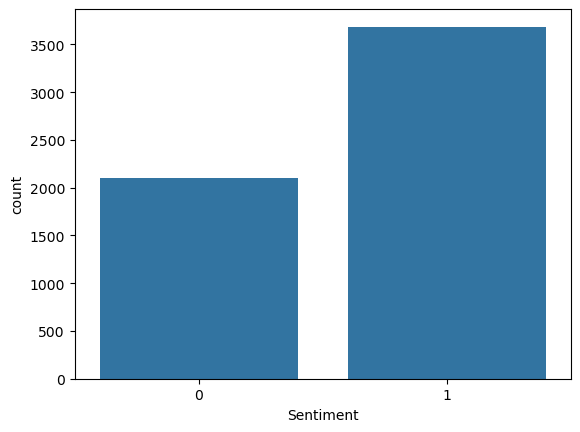

2


In [13]:
sns.countplot(x=stock_df['Sentiment'])
plt.show()
# plt.clf()
print(stock_df['Sentiment'].nunique())

#Perform data clearning

##Pre-run

In [14]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [15]:
# Test = '$I love LLM *{}[$#%!!'
# Test_punc_removed = [char for char in Test if char not in string.punctuation]
# Test_punc_removed_join = ''.join(Test_punc_removed)
# print(Test_punc_removed_join)

In [16]:
# Test = 'Hello, this is a test string! Are you ready?'
# Test_punc_removed = [char for char in Test if char not in string.punctuation]
# print(Test_punc_removed)
# Test_punc_removed_join = ''.join(Test_punc_removed)
# print(Test_punc_removed_join)

In [17]:
def remove_punc(message):
  Test_punc_removed = [char for char in message if char not in string.punctuation]
  Test_punc_removed_join = ''. join(Test_punc_removed)

  return Test_punc_removed_join


In [18]:
stock_df['Text Without Punctuation'] = stock_df['Text'].apply(remove_punc)
print(stock_df)
# print(stock)
print(stock_df['Text'][1])
print(stock_df['Text Without Punctuation'][1])

                                                   Text  Sentiment  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...          1   
1     user: AAP MOVIE. 55% return for the FEA/GEED i...          1   
2     user I'd be afraid to short AMZN - they are lo...          1   
3                                     MNTA Over 12.00            1   
4                                      OI  Over 21.37            1   
...                                                 ...        ...   
5786  Industry body CII said #discoms are likely to ...          0   
5787  #Gold prices slip below Rs 46,000 as #investor...          0   
5788  Workers at Bajaj Auto have agreed to a 10% wag...          1   
5789  #Sharemarket LIVE: Sensex off day’s high, up 6...          1   
5790  #Sensex, #Nifty climb off day's highs, still u...          1   

                               Text Without Punctuation  
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...  
1     user AAP MOVIE 55 return for the FEAG

#Data Cleaning--Remove stopwords

In [19]:
#download stopwords
nltk.download("stopwords")
stopwords.words('english')

#Obtain additional stopwords from nltk
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from','subject','re','edu','use','will','aap','co','day','user','stock','today','week','year'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\annah\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


Note on gensim.utils.simple_preprocess(text):

Functionality:

* Tokenization: The simple_preprocess function first tokenizes the input text into individual words or tokens.
* Lowercasing: It converts all text to lowercase to ensure consistency (e.g., "Hello" and "hello" are treated as the same word).
* Filtering: It filters out tokens that are too short or too long based on default or user-defined parameters.
* Normalization: It might perform additional text normalization steps, such as removing accents or special characters.

Output:

*  The output of gensim.utils.simple_preprocess(text) is typically a list of preprocessed tokens or words that can be further used for tasks like topic modeling, text classification, or any other natural language processing tasks.

In [20]:
def preprocess(text):
  result = []
  for token in gensim.utils.simple_preprocess(text):
    if len(token) >= 3 and token not in stop_words:
      result.append(token)
  return result


In [21]:
stock_df['Text Without Punc & Stopwords'] = stock_df['Text Without Punctuation'].apply(preprocess)
print(stock_df['Text'][1], stock_df['Text Without Punc & Stopwords'][1])
print(stock_df)

user: AAP MOVIE. 55% return for the FEA/GEED indicator just 15 trades for the year.  AWESOME.   ['movie', 'return', 'feageed', 'indicator', 'trades', 'awesome']
                                                   Text  Sentiment  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...          1   
1     user: AAP MOVIE. 55% return for the FEA/GEED i...          1   
2     user I'd be afraid to short AMZN - they are lo...          1   
3                                     MNTA Over 12.00            1   
4                                      OI  Over 21.37            1   
...                                                 ...        ...   
5786  Industry body CII said #discoms are likely to ...          0   
5787  #Gold prices slip below Rs 46,000 as #investor...          0   
5788  Workers at Bajaj Auto have agreed to a 10% wag...          1   
5789  #Sharemarket LIVE: Sensex off day’s high, up 6...          1   
5790  #Sensex, #Nifty climb off day's highs, still u...          1   

#Plot Wordcloud

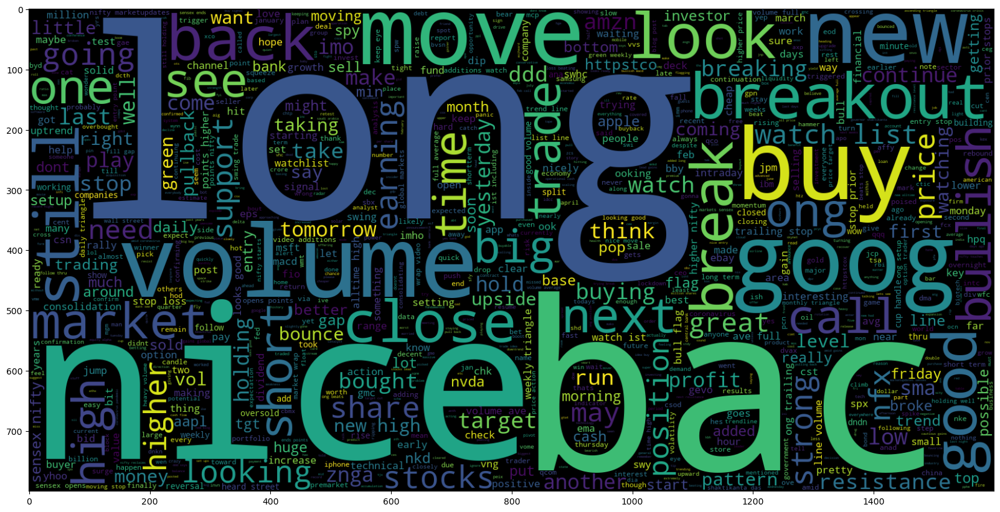

In [22]:
# join words into string
stock_df['Text Without Punc & Stopwords Joined'] = stock_df['Text Without Punc & Stopwords'].apply(lambda x: " ".join(x))
# print(stock_df.head())
# print(" ".join(stock_df[0:2]['Text Without Punc & Stopwords Joined']))
# # plot the word cloud for text with positive sentiment
plt.figure(figsize=(20,20))
wc = WordCloud(max_words = 1000, width = 1600, height = 800).generate(" ".join(stock_df[stock_df['Sentiment']==1]['Text Without Punc & Stopwords Joined']))
plt.imshow(wc, interpolation= 'bilinear')

# Visualize Cleaned Dataset

In [23]:
print(stock_df)

                                                   Text  Sentiment  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...          1   
1     user: AAP MOVIE. 55% return for the FEA/GEED i...          1   
2     user I'd be afraid to short AMZN - they are lo...          1   
3                                     MNTA Over 12.00            1   
4                                      OI  Over 21.37            1   
...                                                 ...        ...   
5786  Industry body CII said #discoms are likely to ...          0   
5787  #Gold prices slip below Rs 46,000 as #investor...          0   
5788  Workers at Bajaj Auto have agreed to a 10% wag...          1   
5789  #Sharemarket LIVE: Sensex off day’s high, up 6...          1   
5790  #Sensex, #Nifty climb off day's highs, still u...          1   

                               Text Without Punctuation  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...   
1     user AAP MOVIE 55 return for the FE

In [24]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\annah\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\annah\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [25]:
print(stock_df['Text Without Punc & Stopwords Joined'][0])
print(nltk.word_tokenize(stock_df['Text Without Punc & Stopwords Joined'][0]))


kickers watchlist xide tit soq pnk cpw bpz trade method method see prev posts
['kickers', 'watchlist', 'xide', 'tit', 'soq', 'pnk', 'cpw', 'bpz', 'trade', 'method', 'method', 'see', 'prev', 'posts']


tokens = nltk.word_tokenize(doc): Inside the loop, the current document doc is tokenized using nltk.word_tokenize(). This function from the NLTK library splits the document into individual words or tokens []. For example, if doc is "This is a sentence.", then tokens would be ['This', 'is', 'a', 'sentence', '.'].


In [26]:
maxlen = -1
for entry in stock_df['Text Without Punc & Stopwords Joined']:
  tokens = nltk.word_tokenize(entry)
  if(maxlen < len(tokens)):
    maxlen = len(tokens)
print(f"The maxium number of words in any entry is {maxlen}.")

The maxium number of words in any entry is 20.


In [27]:
tweets_length = [len(nltk.word_tokenize(x)) for x in stock_df['Text Without Punc & Stopwords Joined']]
print(tweets_length)

[14, 6, 7, 1, 0, 1, 8, 13, 8, 4, 10, 18, 8, 8, 11, 5, 12, 10, 12, 4, 6, 5, 2, 5, 3, 10, 3, 3, 9, 6, 8, 10, 8, 3, 10, 11, 4, 8, 11, 10, 10, 7, 9, 8, 4, 10, 8, 7, 7, 9, 10, 10, 8, 2, 14, 12, 9, 8, 1, 14, 7, 11, 5, 13, 6, 6, 7, 6, 6, 10, 9, 4, 10, 13, 16, 6, 9, 6, 2, 11, 5, 4, 9, 11, 16, 4, 9, 5, 6, 2, 1, 5, 9, 4, 7, 6, 7, 10, 1, 3, 9, 4, 16, 8, 10, 11, 18, 6, 7, 13, 12, 9, 3, 3, 10, 10, 8, 6, 8, 5, 5, 8, 9, 15, 3, 5, 9, 18, 13, 11, 3, 1, 1, 2, 7, 12, 12, 8, 8, 10, 9, 10, 15, 8, 9, 9, 12, 10, 6, 10, 13, 4, 11, 8, 15, 13, 8, 12, 5, 5, 3, 7, 2, 4, 10, 5, 6, 10, 6, 16, 9, 6, 5, 10, 9, 10, 8, 2, 10, 9, 10, 12, 7, 10, 7, 3, 6, 5, 9, 9, 4, 6, 5, 4, 4, 8, 10, 8, 8, 13, 9, 7, 10, 12, 8, 6, 5, 3, 10, 11, 6, 9, 10, 13, 10, 7, 12, 7, 11, 10, 4, 4, 3, 10, 2, 9, 10, 15, 12, 10, 13, 9, 8, 2, 1, 12, 12, 6, 9, 9, 12, 5, 2, 3, 8, 6, 14, 5, 6, 7, 9, 1, 1, 11, 7, 14, 4, 4, 9, 5, 4, 9, 9, 10, 13, 5, 11, 4, 4, 6, 1, 8, 4, 11, 4, 6, 11, 4, 10, 8, 8, 6, 10, 3, 10, 10, 2, 9, 10, 13, 9, 10, 3, 2, 8, 4, 6, 14, 5, 

In [28]:
fig = px.histogram(x = tweets_length, nbins = 50)
fig.show()

# Prepare the Data by Tokenizing and Padding

In [29]:
print(stock_df)

                                                   Text  Sentiment  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...          1   
1     user: AAP MOVIE. 55% return for the FEA/GEED i...          1   
2     user I'd be afraid to short AMZN - they are lo...          1   
3                                     MNTA Over 12.00            1   
4                                      OI  Over 21.37            1   
...                                                 ...        ...   
5786  Industry body CII said #discoms are likely to ...          0   
5787  #Gold prices slip below Rs 46,000 as #investor...          0   
5788  Workers at Bajaj Auto have agreed to a 10% wag...          1   
5789  #Sharemarket LIVE: Sensex off day’s high, up 6...          1   
5790  #Sensex, #Nifty climb off day's highs, still u...          1   

                               Text Without Punctuation  \
0     Kickers on my watchlist XIDE TIT SOQ PNK CPW B...   
1     user AAP MOVIE 55 return for the FE

In [30]:
list_of_words = []
for i in stock_df['Text Without Punc & Stopwords']:
  for j in i:
    list_of_words.append(j)
print(list_of_words)

['kickers', 'watchlist', 'xide', 'tit', 'soq', 'pnk', 'cpw', 'bpz', 'trade', 'method', 'method', 'see', 'prev', 'posts', 'movie', 'return', 'feageed', 'indicator', 'trades', 'awesome', 'afraid', 'short', 'amzn', 'looking', 'like', 'nearmonopoly', 'ebooks', 'mnta', 'pgnx', 'current', 'downtrend', 'break', 'otherwise', 'shortterm', 'correction', 'medterm', 'downtrend', 'mondays', 'relative', 'weakness', 'nyx', 'win', 'tie', 'tap', 'ice', 'int', 'bmc', 'aon', 'chk', 'biib', 'goog', 'ower', 'trend', 'line', 'channel', 'test', 'volume', 'support', 'watch', 'tomorrow', 'ong', 'entry', 'assuming', 'fcx', 'opens', 'tomorrow', 'trigger', 'buy', 'still', 'much', 'like', 'setup', 'really', 'worries', 'everyone', 'expects', 'market', 'rally', 'nowusually', 'exact', 'opposite', 'happens', 'every', 'time', 'shall', 'see', 'soon', 'bac', 'spx', 'jpm', 'gamcos', 'arry', 'haverty', 'apple', 'extremely', 'cheap', 'great', 'video', 'maykiljil', 'posted', 'agree', 'msft', 'going', 'higher', 'possibly', 'n

In [31]:
total_words = len(list(set(list_of_words)))
print(total_words)

9268


In [32]:
# split the data into test and train
X = stock_df['Text Without Punc & Stopwords']
y = stock_df['Sentiment']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

print(X_train.shape)
print(X_test.shape)
print(X_train)

(5211,)
(580,)
475     [tso, long, crack, spreads, say, low, short, g...
3726        [time, shorty, pants, csx, trains, esistance]
3239                    [scco, double, top, sma, turning]
2790    [sec, launch, investigation, citron, company, ...
4690    [msft, spanish, group, sues, microsoft, europe...
                              ...                        
5233    [look, shortterm, relief, available, small, bu...
4975    [crude, prices, track, hit, new, low, friday, ...
625                [green, weekly, triangle, ktospdating]
4263    [picked, axp, avg, really, strong, stayed, ear...
3432    [esf, interesting, parallel, apple, bubbleand,...
Name: Text Without Punc & Stopwords, Length: 5211, dtype: object


In [33]:
# Tokenization
tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(X_train)

train_sequences = tokenizer.texts_to_sequences(X_train)
print(train_sequences)
test_sequences = tokenizer.texts_to_sequences(X_test)
print(test_sequences)

[[854, 4, 1523, 1291, 206, 64, 1, 5, 1], [25, 3623, 3624, 974, 3625, 1524], [1116, 453, 133, 121, 645], [1885, 1292, 3626, 3627, 193, 2466, 3628, 3629, 65, 1, 78, 104], [225, 3630, 646, 3631, 975, 1117, 3632], [27, 428, 15, 20, 51, 291], [389, 31, 214, 215, 47, 216, 62, 58, 2], [1118, 483], [109, 346, 3633, 1293, 1119, 306, 155, 3634, 3635, 976, 54, 3636, 3637], [783, 1120, 521, 57, 2467, 555], [429, 371, 2468, 390, 81, 454, 13], [56, 3638, 1525, 408, 715, 2469, 2470, 522, 3639, 3640, 3641], [32, 16], [28, 53, 292, 200], [51, 170, 235, 66, 105, 3642, 484], [36, 186, 2471, 485, 266, 20, 556, 3643], [74, 186, 136, 3644, 455, 456], [211, 35, 226, 3645], [3646, 8, 523, 2472, 784, 95, 2473, 193, 112, 855, 54, 3647], [1], [1121, 18, 2474, 2475, 96, 1294, 3648, 3649], [171, 3650, 1886, 267, 20, 115, 97, 83, 179, 2476], [137, 977], [524, 2477, 1887, 194, 15, 716, 12, 15, 84], [1888, 1295, 647, 307, 648, 372, 1526, 3651, 14], [2478, 58, 15, 649, 2479, 325], [48, 106, 308, 1296, 113, 856, 650, 8

In [34]:
print("The encoding for document\n", X_train[1:2],"\n is: ", train_sequences[1])

The encoding for document
 3726    [time, shorty, pants, csx, trains, esistance]
Name: Text Without Punc & Stopwords, dtype: object 
 is:  [25, 3623, 3624, 974, 3625, 1524]


* maxlen=29: This is a critical parameter. It sets the maximum length for all sequences. If a sequence is shorter than 29, it will be padded; if it's longer, it will be truncated []. The value 29 likely comes from an earlier analysis of your data, where you determined the maximum or a suitable length for your sequences (e.g., based on the longest sentence in your dataset or a chosen upper limit).

* padding='post': This determines how padding is applied. 'post' means that if a sequence is shorter than maxlen, the padding (usually zeros) is added to the end of the sequence. For example, if a sequence is [1, 2, 3] and maxlen is 5, the result would be [1, 2, 3, 0, 0] [].

* truncating='post': This determines how sequences longer than maxlen are shortened. 'post' means that if a sequence is longer than maxlen, elements are removed from the end of the sequence until it fits. For example, if a sequence is [1, 2, 3, 4, 5] and maxlen is 3, the result would be [1, 2, 3] [].

* padded_train: The result of this operation is a NumPy array where all sequences from your training data have a length of 29, achieved through padding or truncation.

In [35]:
padded_train = pad_sequences(train_sequences, maxlen = 29, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen=29, truncating = 'post')

In [36]:
for i, doc in enumerate(padded_train[:3]):
  print("The padded encoding for document: ", i + 1, "is:", doc)

The padded encoding for document:  1 is: [ 854    4 1523 1291  206   64    1    5    1    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0]
The padded encoding for document:  2 is: [  25 3623 3624  974 3625 1524    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0]
The padded encoding for document:  3 is: [1116  453  133  121  645    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0]


In [38]:
y_train_cat = to_categorical(y_train, 2)
y_test_cat = to_categorical(y_test, 2)

to_categorical(y_train, 2): This line converts the y_train data (which presumably contains integer labels for the training set) into a one-hot encoded format [1][2]. The 2 specifies that there are two possible classes [3]. For example, if y_train contained the value 0, it would be converted to [1, 0]. If it contained the value 1, it would be converted to [0, 1].

In [39]:
y_train_cat.shape

(5211, 2)

In [40]:
y_test_cat.shape

(580, 2)

In [41]:
y_train_cat

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

#FROM GPT
1. model = Sequential()

Explanation: This line creates a Sequential model, which means you're building a neural network where the layers are stacked linearly, one after the other. It's the simplest way to define a model in Keras for many common architectures.
2. model.add(Embedding(total_words, output_dim = 512))

Explanation: This adds an embedding layer to the model.
Embedding: This layer is crucial for handling text data. It converts words (or other discrete tokens) into dense vectors of a fixed size.
total_words: This should be the total number of unique words (tokens) in your vocabulary. The embedding layer needs to know how many different words it needs to represent.
output_dim = 512: This specifies the dimensionality of the embedding vectors. Each word will be represented by a vector of size 512. A larger output_dim allows the embedding layer to capture more complex relationships between words, but also increases the number of parameters in your model.
How it works: The embedding layer learns a mapping from each word in your vocabulary to a vector in the 512-dimensional space. Words with similar meanings or contexts will tend to have similar embedding vectors.

3. model.add(LSTM(256))

Explanation: This adds an LSTM (Long Short-Term Memory) layer to the model.
LSTM: As we discussed earlier, LSTMs are a type of recurrent neural network (RNN) specifically designed to handle sequential data and capture long-range dependencies.
256: This specifies the number of LSTM units (memory cells) in the layer. Each unit maintains its own internal state and contributes to the overall representation of the sequence. A larger number of units allows the LSTM to learn more complex patterns, but also increases the model's complexity.
How it works: The LSTM layer processes the sequence of word embeddings produced by the embedding layer. It uses its memory cells and gates to selectively remember or forget information as it iterates through the sequence, allowing it to capture dependencies between words that are far apart in the input.

4. model.add(Dense(128, activation = 'relu'))

Explanation: This adds a dense (fully connected) layer to the model.
Dense: This is a standard fully connected layer where each neuron is connected to every neuron in the previous layer.
128: This specifies the number of neurons in the dense layer.
activation = 'relu': This sets the activation function for the layer to ReLU (Rectified Linear Unit). ReLU is a common activation function that introduces non-linearity into the model, allowing it to learn more complex relationships.
How it works: The dense layer takes the output from the LSTM layer and transforms it into a new representation. The ReLU activation function helps the model learn non-linear patterns in the data.
5. model.add(Dropout(0.3))

Explanation: This adds a dropout layer to the model.
Dropout: Dropout is a regularization technique used to prevent overfitting.
0.3: This specifies the dropout rate, which is the probability that a neuron will be randomly "dropped out" (deactivated) during training. In this case, 30% of the neurons in the previous layer will be randomly deactivated during each training update.
How it works: By randomly dropping out neurons, dropout forces the network to learn more robust features that are not dependent on any single neuron. This helps to prevent the model from memorizing the training data and improves its ability to generalize to unseen data.
6. model.add(Dense(2, activation = 'softmax'))

Explanation: This adds another dense layer to the model.
Dense: Another fully connected layer.
2: This specifies the number of neurons in the layer. Since the activation function is 'softmax', this layer is likely the output layer of a classification model with 2 classes.
activation = 'softmax': This sets the activation function to softmax. Softmax is commonly used in the output layer of multi-class classification models. It converts the raw output of the layer into a probability distribution over the classes. The output of the layer will be a vector of size 2, where each element represents the probability that the input belongs to that class.
How it works: This layer takes the output from the previous dense layer and produces a probability distribution over the two classes. The softmax function ensures that the probabilities sum up to 1.
7. model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['acc'])

Explanation: This configures the model for training.
optimizer = 'adam': This specifies the optimization algorithm to use during training. Adam is a popular and efficient optimization algorithm that adapts the learning rate for each parameter.
loss = 'categorical_crossentropy': This specifies the loss function to use during training. Categorical cross-entropy is a common loss function for multi-class classification problems where the labels are one-hot encoded (as is likely the case here, given the to_categorical function used earlier).
metrics = ['acc']: This specifies the metrics to track during training. 'acc' stands for accuracy, which is the percentage of correctly classified samples.
How it works: The compile step prepares the model for training by specifying how the model will be updated based on the training data and how its performance will be evaluated.
8. model.summary()

Explanation: This prints a summary of the model architecture to the console. It shows the layers, their output shapes, and the number of parameters in each layer.
How it works: It's a useful way to verify that your model has the structure you intended and to understand the memory footprint of the model (number of parameters).
In summary, this code defines a sequential neural network for a binary classification task (2 classes). It uses an embedding layer to represent words as dense vectors, an LSTM layer to capture sequential dependencies, dense layers to perform non-linear transformations, and dropout to prevent overfitting. The model is compiled with the Adam optimizer and categorical cross-entropy loss, and its performance is evaluated using accuracy.

In [42]:
# Sequential Model
model = Sequential()

# embedding layer
model.add(Embedding(total_words, output_dim = 512))

# Bi-Directional RNN and LSTM
model.add(LSTM(256))

# Dense layers
model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.3))
model.add(Dense(2,activation = 'softmax'))
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['acc'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [43]:
# train the model
model.fit(padded_train, y_train_cat, batch_size = 32, validation_split = 0.2, epochs = 2)

Epoch 1/2
131/131 ━━━━━━━━━━━━━━━━━━━━ 24s 118ms/step - acc: 0.6394 - loss: 0.6598 - val_acc: 0.6242 - val_loss: 0.6620
Epoch 2/2
131/131 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - acc: 0.7087 - loss: 0.6111 - val_acc: 0.7229 - val_loss: 0.5935


In [44]:
# make prediction
pred = model.predict(padded_test)
# make prediction
prediction = []
for i in pred:
  prediction.append(np.argmax(i))

# list containing original values
original = []
for i in y_test_cat:
  original.append(np.argmax(i))



19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step


<Axes: >

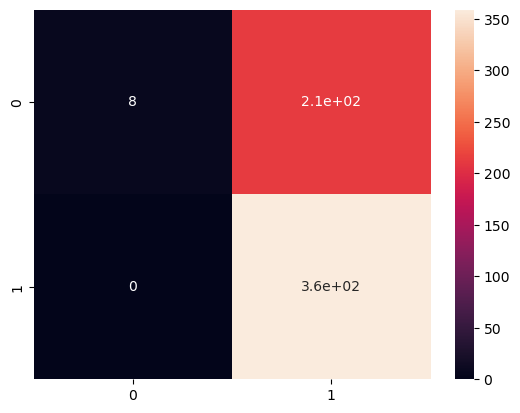

In [45]:
# acuracy score on text data
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, prediction)
accuracy

# Plot the confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(original, prediction)
sns.heatmap(cm, annot = True)